In [1]:
# Load the necessary libraries 
import datetime 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt

In [2]:
# Loading the Amsterdam Zuid dataset 
df_kadaster = pd.read_csv('final-amsterdamzuid.csv', index_col = False) 
df_kadaster

,Unnamed: 0,openbareruimtenaam,huisnummer,huisletter,huisnummertoevoeging,postcode,buurtnaam,buurtcode,wijknaam,wijkcode,...,aantal_pand_relaties_dit_vbo,pand_id,aantal_vbo_relaties_dit_pnd,vbo_pnd_1_op_1,opp_pand,woningtype,omtrek_pand,verhouding_opp_vbo_opp_pnd,pandstatus,bouwjaar
0,329595,Cornelis Schuytstraat,74,NaN,NaN,1071JL,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,...,1.0,3.631000e+14,1.0,1.0,241.0,NaN,70.0,3.20,Pand in gebruik,1921.0
1,329626,J.J. Viottastraat,41,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,...,1.0,3.631000e+14,1.0,1.0,8.0,NaN,11.0,0.63,Pand in gebruik,1993.0
2,329627,J.J. Viottastraat,43,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,...,1.0,3.631000e+14,1.0,1.0,328.0,NaN,86.0,3.07,Pand in gebruik,1992.0
3,329628,J.J. Viottastraat,47,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,...,1.0,3.631000e+14,2.0,0.0,273.0,NaN,72.0,2.77,Pand in gebruik,1993.0
4,329629,J.J. Viottastraat,49,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,...,1.0,3.631000e+14,2.0,0.0,273.0,Vrijstaande woning,72.0,2.77,Pand in gebruik,1993.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17891,9513313,Willem Royaardsstraat,18,F,NaN,NaN,Diepenbrockbuurt,BU03634900,Apollobuurt,WK036349,...,1.0,3.631000e+14,1.0,1.0,19.0,NaN,19.0,0.95,Pand in gebruik,1938.0
17892,9513314,Willem Royaardsstraat,18,G,NaN,NaN,Diepenbrockbuurt,BU03634900,Apollobuurt,WK036349,...,1.0,3.631000e+14,1.0,1.0,19.0,NaN,19.0,0.95,Pand in gebruik,1938.0
17893,9518655,Zuidplein,5,NaN,NaN,NaN,Zuidas Noord,BU03632300,Zuidas,WK036323,...,1.0,3.631000e+14,1.0,1.0,53.0,NaN,35.0,34.42,Pand in gebruik,2021.0
17894,9518657,Zuidplein,26,NaN,NaN,NaN,Zuidas Noord,BU03632300,Zuidas,WK036323,...,1.0,3.631000e+14,60.0,0.0,4831.0,NaN,311.0,5.03,Pand in gebruik,2004.0


In [3]:
df_kadaster.dtypes

Unnamed: 0                        int64
openbareruimtenaam               object
huisnummer                        int64
huisletter                       object
huisnummertoevoeging             object
postcode                         object
buurtnaam                        object
buurtcode                        object
wijknaam                         object
wijkcode                         object
woonplaats                       object
gemeentecode                      int64
nevenadres                        int64
typeadresseerbaarobject          object
adresseerbaarobject_status       object
opp_adresseerbaarobject_m2        int64
aantal_nad_per_adresobject        int64
adresseerbaarobject_id            int64
x                               float64
y                               float64
lon                             float64
lat                             float64
woonfunctie                     float64
bijeenkomstfunctie              float64
celfunctie                      float64


According to the research by Xin and Huan (2013, https://www.sciencedirect.com/science/article/pii/S0379711213001653), most fire occurences from 2007 to 2010 within China happened in "Residential buildings" (complete top 3 is also "Industry buildings" and "Public buildings", see table 3 of the linked paper). So the probability of fire is higher at residential buildings in comparison to the other two types. 

In [4]:
BBox = ((df_kadaster.lon.min(),   df_kadaster.lon.max(),      
         df_kadaster.lat.min(), df_kadaster.lat.max()))
BBox

(4.86803003, 4.89775794, 52.33965358, 52.35284172)

In [5]:
# Map made by https://www.openstreetmap.org/export#map=13/52.3373/4.8528
ams_z = plt.imread('map.png')

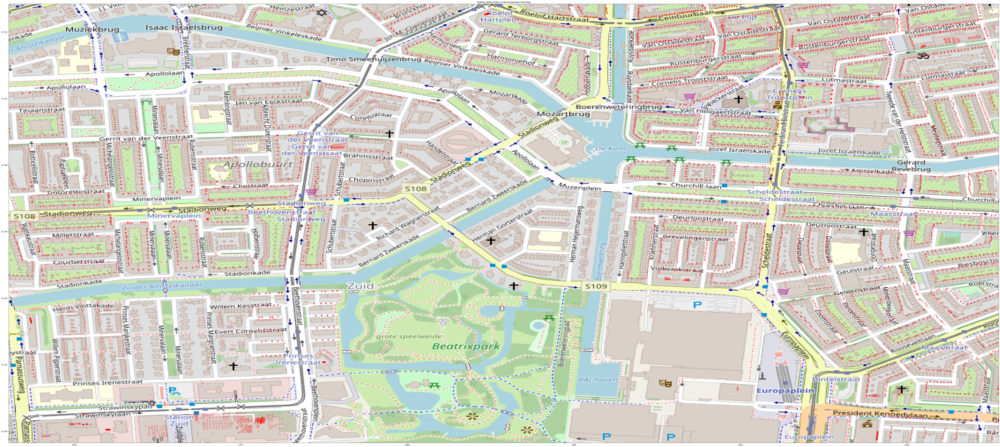

In [6]:
fig, ax = plt.subplots(figsize = (100, 90))
ax.scatter(df_kadaster.lon, df_kadaster.lat, zorder = 1, alpha = 0.2, c = 'r', s = 10, linewidths = 6)
ax.set_title('Plotting Spatial Data on the Amsterdam-Zuid Map')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(ams_z, zorder = 0, extent = BBox, aspect = 'equal')

In [7]:
df_energy = pd.read_csv('Publicatiefile_Energie_2020.csv', index_col = False, sep = ';')
df_energy = df_energy.drop(['Gemiddelde_elektriciteitslevering_woningen', 'Gemiddelde_elektriciteitslevering_bedrijven'], 
                           axis = 1)
df_energy = df_energy.rename(columns = {"Postcode6":"postcode", "Gemiddelde_aardgaslevering_woningen":"gem_gas_woning", 
                                        "Gemiddelde_aardgaslevering_woningen_gecorrigeerd": "gem_gas_woning_cor", 
                                       "Gemiddelde_aardgaslevering_bedrijven":"gem_gas_bedrijf"})
df_energy = df_energy.replace('.', 0)
df_energy[["gem_gas_woning", "gem_gas_woning_cor", "gem_gas_bedrijf"]] = df_energy[["gem_gas_woning", "gem_gas_woning_cor", 
                                                                                    "gem_gas_bedrijf"]].astype(str).astype(int)
df_energy

,postcode,gem_gas_woning,gem_gas_woning_cor,gem_gas_bedrijf
0,1011AB,0,0,5930
1,1011AC,1800,2090,10410
2,1011AD,0,0,0
3,1011AE,0,0,0
4,1011AG,0,0,4700
...,...,...,...,...
457493,9999XG,0,0,0
457494,9999XH,0,0,0
457495,9999XJ,1970,2290,1340
457496,9999XK,1600,1860,0


In [8]:
df_env = pd.merge(df_kadaster, df_energy, on = 'postcode').drop(['Unnamed: 0'], axis = 1)
df_env 

,openbareruimtenaam,huisnummer,huisletter,huisnummertoevoeging,postcode,buurtnaam,buurtcode,wijknaam,wijkcode,woonplaats,...,vbo_pnd_1_op_1,opp_pand,woningtype,omtrek_pand,verhouding_opp_vbo_opp_pnd,pandstatus,bouwjaar,gem_gas_woning,gem_gas_woning_cor,gem_gas_bedrijf
0,Cornelis Schuytstraat,74,NaN,NaN,1071JL,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,1.0,241.0,NaN,70.0,3.20,Pand in gebruik,1921.0,1560,1810,20260
1,J.J. Viottastraat,41,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,1.0,8.0,NaN,11.0,0.63,Pand in gebruik,1993.0,1920,2230,6920
2,J.J. Viottastraat,43,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,1.0,328.0,NaN,86.0,3.07,Pand in gebruik,1992.0,1920,2230,6920
3,J.J. Viottastraat,47,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,0.0,273.0,NaN,72.0,2.77,Pand in gebruik,1993.0,1920,2230,6920
4,J.J. Viottastraat,49,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,0.0,273.0,Vrijstaande woning,72.0,2.77,Pand in gebruik,1993.0,1920,2230,6920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17810,Veluwelaan,8,NaN,2,1079PZ,Veluwebuurt,BU03635206,Scheldebuurt,WK036352,Amsterdam,...,0.0,170.0,Appartement,53.0,2.44,Pand in gebruik,1952.0,1000,1160,0
17811,Veluwelaan,8,NaN,H,1079PZ,Veluwebuurt,BU03635206,Scheldebuurt,WK036352,Amsterdam,...,0.0,170.0,Appartement,53.0,2.44,Pand in gebruik,1952.0,1000,1160,0
17812,Veluwelaan,10,NaN,1,1079PZ,Veluwebuurt,BU03635206,Scheldebuurt,WK036352,Amsterdam,...,0.0,170.0,Appartement,53.0,2.44,Pand in gebruik,1952.0,1000,1160,0
17813,Veluwelaan,10,NaN,2,1079PZ,Veluwebuurt,BU03635206,Scheldebuurt,WK036352,Amsterdam,...,0.0,170.0,Appartement,53.0,2.44,Pand in gebruik,1952.0,1000,1160,0


In [9]:
df_env['gebruikt_gas'] = ((df_env['gem_gas_woning_cor'] > 0) | (df_env['gem_gas_bedrijf'] > 0))
df_env['gebruikt_gas'] = list(map(int, df_env['gebruikt_gas']))

# 1 = uses gas and 0 = no gas
print(df_env['gebruikt_gas'].value_counts())

1    16888
0      927
Name: gebruikt_gas, dtype: int64


In [10]:
df_env['asbest_potent'] = ((df_env['bouwjaar'] >= 1955) & (df_env['bouwjaar'] <= 1978))
df_env['asbest_potent'] = list(map(int, df_env['asbest_potent']))

# 1 = asbest potential and 0 = no asbest
print(df_env['asbest_potent'].value_counts())

0    16860
1      955
Name: asbest_potent, dtype: int64


In [11]:
df_env['schade_envfunctie'] = ((df_env['woonfunctie'] == 0) & (df_env['industriefunctie'] == 0))
df_env['schade_envfunctie'] = list(map(int, df_env['asbest_potent']))
df_env['schade_envfunctie'] = df_env['schade_envfunctie'].replace({0:1, 1:0})

# 1 = schadelijke functies (industriefuncties & woonfuncties) and 0 = geen schadelijke functies
print(df_env['schade_envfunctie'].value_counts())

1    16860
0      955
Name: schade_envfunctie, dtype: int64


In [12]:
def filter_by_freq(df: pd.DataFrame, column: str, min_freq: int) -> pd.DataFrame:
    """Filters df based on value frequency in specified column.
    
    Input: 
    df: dataframe to be filtered
    column: name column that should be frequency filtered
    min_freq: minimal value frequency for the row to be accepted
    
    Output:
    Frequency filtered dataframe
    
    """
    
    freq = df[column].value_counts()
    frequent_values = freq[freq >= min_freq].index
    return df[df[column].isin(frequent_values)]

In [13]:
woon_post = df_env[df_env['woonfunctie'] == 1]
woon_post = filter_by_freq(woon_post, 'postcode', 10) # 10 zipcodes is arbitrarily set 

df_env['meer_reg_woonfunctie'] = (df_env['postcode'].eq(woon_post['postcode']))
df_env['meer_reg_woonfunctie'] = list(map(int, df_env['meer_reg_woonfunctie']))

# 1 = True, multiple woonfuncties on same zipcode (equal or above 10) and 0 = False, everything below 10 registrations
print(df_env['meer_reg_woonfunctie'].value_counts())

1    14848
0     2967
Name: meer_reg_woonfunctie, dtype: int64


In [14]:
indu_post = df_env[df_env['industriefunctie'] == 1]
indu_post = filter_by_freq(indu_post, 'postcode', 2) # 2 zipcodes is arbitrarily set 

df_env['meer_reg_industriefunctie'] = (df_env['postcode'].eq(indu_post['postcode']))
df_env['meer_reg_industriefunctie'] = list(map(int, df_env['meer_reg_industriefunctie']))

# 1 = True, multiple industriefuncties on same zipcode (equal or above 2) and 0 = False, everything below 1 registrations
print(df_env['meer_reg_industriefunctie'].value_counts())

0    17779
1       36
Name: meer_reg_industriefunctie, dtype: int64


In [15]:
df_env.dtypes

openbareruimtenaam               object
huisnummer                        int64
huisletter                       object
huisnummertoevoeging             object
postcode                         object
buurtnaam                        object
buurtcode                        object
wijknaam                         object
wijkcode                         object
woonplaats                       object
gemeentecode                      int64
nevenadres                        int64
typeadresseerbaarobject          object
adresseerbaarobject_status       object
opp_adresseerbaarobject_m2        int64
aantal_nad_per_adresobject        int64
adresseerbaarobject_id            int64
x                               float64
y                               float64
lon                             float64
lat                             float64
woonfunctie                     float64
bijeenkomstfunctie              float64
celfunctie                      float64
gezondheidszorgfunctie          float64


$CO^2$ will be released when a fire occurs at buildings that uses gasses, so the environmental effect would be higher when that effect occurs. 

According to Martin, Tomida, and Meacham (2016, https://firesciencereviews.springeropen.com/articles/10.1186/s40038-016-0014-1), a combination of industrial buildings and gas usage, the environmental effects would be higher in comparison to the normal residential ones. It could also affect the waters when an industrial building is located near waters (release/leakage of chemicals). 

According to the fire deparment in the Netherlands (https://www.ifv.nl/kennisplein/Documents/20210321-BA-Jaaroverzicht-fatale-woningbranden-2020.pdf), the most common fires in the Netherlands (2020) were caused by equipment failure, smoking, cooking, playing with fire, and candles. 35% of them were classified as unknown, assuming that it is caused by people who have started a fire.  

We are only focusing on the air effect when a fire occurs, since the effect of ground is more applicable for the infrastructure effect, while the effect on water depends if there is an industry is located near the water. When that will result in a fire, then it will be leaking any chemicals in the water, but that is not the case in Amsterdam-Zuid. It becomes important when we are calculating the environmental effect in industrial areas which are located near waters, for example the industrial areas of Sloterdijk. 

**Environmental Effects Categorisation** (based on the features that we have and literature) 
* No/slight effect: alle functies - gas usage +/- year of build (outside 1955-1978)
* Minor effect: alle functies (except for multiple woonfuncties/industriefuncties registered on same postcode) + gas usage +/- year of build (outside 1955-1978) 
* Local effect: multiple woonfuncties located on the same zipcode + gas usage + year of build (between 1955-1978)
* Regional effect: industriefuncties + gas usage + year of build (between 1955-1978) 
* National effect: multiple industriefuncties located on the same zipcode + gas usage + year of build (between 1955-1978) 

In [16]:
df_env['env_effect'] = df_env['gebruikt_gas'] + df_env['asbest_potent'] + df_env['schade_envfunctie'] + df_env['meer_reg_woonfunctie'] + df_env['meer_reg_industriefunctie']
df_env

,openbareruimtenaam,huisnummer,huisletter,huisnummertoevoeging,postcode,buurtnaam,buurtcode,wijknaam,wijkcode,woonplaats,...,bouwjaar,gem_gas_woning,gem_gas_woning_cor,gem_gas_bedrijf,gebruikt_gas,asbest_potent,schade_envfunctie,meer_reg_woonfunctie,meer_reg_industriefunctie,env_effect
0,Cornelis Schuytstraat,74,NaN,NaN,1071JL,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,1921.0,1560,1810,20260,1,0,1,0,0,2
1,J.J. Viottastraat,41,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,1993.0,1920,2230,6920,1,0,1,0,0,2
2,J.J. Viottastraat,43,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,1992.0,1920,2230,6920,1,0,1,0,0,2
3,J.J. Viottastraat,47,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,1993.0,1920,2230,6920,1,0,1,0,0,2
4,J.J. Viottastraat,49,NaN,NaN,1071JP,Banpleinbuurt,BU03634704,Museumkwartier,WK036347,Amsterdam,...,1993.0,1920,2230,6920,1,0,1,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17810,Veluwelaan,8,NaN,2,1079PZ,Veluwebuurt,BU03635206,Scheldebuurt,WK036352,Amsterdam,...,1952.0,1000,1160,0,1,0,1,1,0,3
17811,Veluwelaan,8,NaN,H,1079PZ,Veluwebuurt,BU03635206,Scheldebuurt,WK036352,Amsterdam,...,1952.0,1000,1160,0,1,0,1,1,0,3
17812,Veluwelaan,10,NaN,1,1079PZ,Veluwebuurt,BU03635206,Scheldebuurt,WK036352,Amsterdam,...,1952.0,1000,1160,0,1,0,1,1,0,3
17813,Veluwelaan,10,NaN,2,1079PZ,Veluwebuurt,BU03635206,Scheldebuurt,WK036352,Amsterdam,...,1952.0,1000,1160,0,1,0,1,1,0,3


In [17]:
df_env['env_effect'].value_counts()

3    14850
2     2072
1      893
Name: env_effect, dtype: int64

In [18]:
no_effect = df_env[df_env['env_effect'] == 1]
minor_effect = df_env[df_env['env_effect'] == 2]
local_effect = df_env[df_env['env_effect'] == 3]

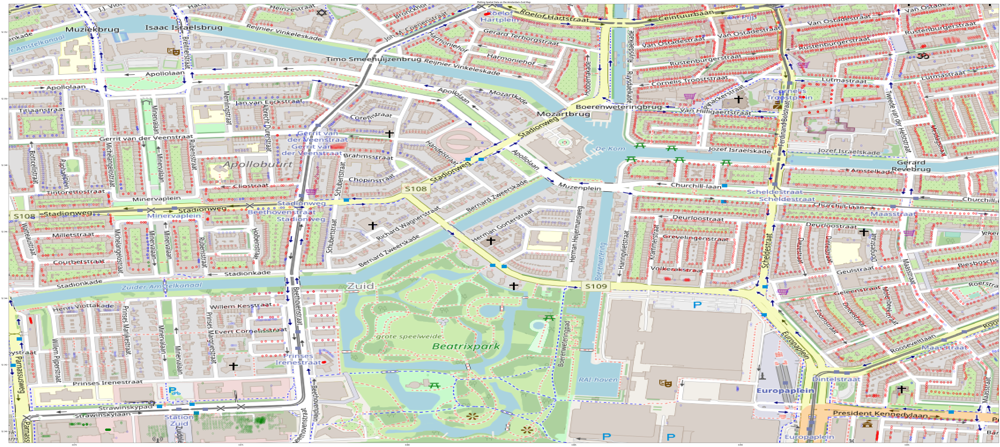

In [19]:
fig, ax = plt.subplots(figsize = (100, 90))

ax.scatter(no_effect.lon, no_effect.lat, zorder = 1, alpha = 0.2, c = 'g', s = 10, linewidths = 10, label = 'no effect')
ax.scatter(minor_effect.lon, minor_effect.lat, zorder = 1, alpha = 0.2, c = 'b', s = 10, linewidths = 10, label = 'minor effect')
ax.scatter(local_effect.lon, local_effect.lat, zorder = 1, alpha = 0.2, c = 'r', s = 10, linewidths = 10, label = 'local effect')

ax.set_title('Plotting Spatial Data on the Amsterdam-Zuid Map')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(ams_z, zorder = 0, extent = BBox, aspect = 'equal')